In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Now it's time for another guided example. This time we're going to look at recipes. Specifically we'll use the epicurious dataset, which has a collection of recipes, key terms and ingredients, and their ratings.

What we want to see is if we can use the ingredient and keyword list to predict the rating. For someone writing a cookbook this could be really useful information that could help them choose which recipes to include because they're more likely to be enjoyed and therefore make the book more likely to be successful.

First let's load the dataset. It's [available on Kaggle](https://www.kaggle.com/hugodarwood/epirecipes). We'll use the csv file here and as pull out column names and some summary statistics for ratings.

In [2]:
raw_data = pd.read_csv('epi_r.csv')

In [3]:
list(raw_data.columns)

['title',
 'rating',
 'calories',
 'protein',
 'fat',
 'sodium',
 '#cakeweek',
 '#wasteless',
 '22-minute meals',
 '3-ingredient recipes',
 '30 days of groceries',
 'advance prep required',
 'alabama',
 'alaska',
 'alcoholic',
 'almond',
 'amaretto',
 'anchovy',
 'anise',
 'anniversary',
 'anthony bourdain',
 'aperitif',
 'appetizer',
 'apple',
 'apple juice',
 'apricot',
 'arizona',
 'artichoke',
 'arugula',
 'asian pear',
 'asparagus',
 'aspen',
 'atlanta',
 'australia',
 'avocado',
 'back to school',
 'backyard bbq',
 'bacon',
 'bake',
 'banana',
 'barley',
 'basil',
 'bass',
 'bastille day',
 'bean',
 'beef',
 'beef rib',
 'beef shank',
 'beef tenderloin',
 'beer',
 'beet',
 'bell pepper',
 'berry',
 'beverly hills',
 'birthday',
 'biscuit',
 'bitters',
 'blackberry',
 'blender',
 'blue cheese',
 'blueberry',
 'boil',
 'bok choy',
 'bon appétit',
 'bon app��tit',
 'boston',
 'bourbon',
 'braise',
 'bran',
 'brandy',
 'bread',
 'breadcrumbs',
 'breakfast',
 'brie',
 'brine',
 'brisk

In [4]:
raw_data.rating.describe()

count    20052.000000
mean         3.714467
std          1.340829
min          0.000000
25%          3.750000
50%          4.375000
75%          4.375000
max          5.000000
Name: rating, dtype: float64

We learn a few things from this analysis. From a ratings perspective, there are just over 20,000 recipes with an average rating of 3.71. What is interesting is that the 25th percentile is actually above the mean. This means there is likely some kind of outlier population. This makes sense when we think about reviews: some bad recipes may have very few very low reviews.

Let's validate the idea a bit further with a histogram.

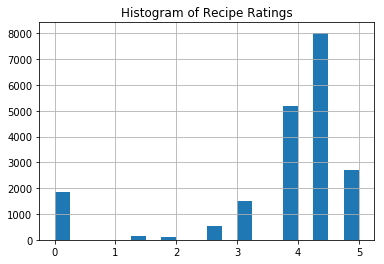

In [5]:
raw_data.rating.hist(bins=20)
plt.title('Histogram of Recipe Ratings')
plt.show()

So a few things are shown in this histogram. Firstly there are sharp discontinutities. We don't have continuous data. No recipe has a 3.5 rating, for example. Also we see the anticipated increase at 0.

Let's try a naive approach again, this time using SVM Regressor. But first, we'll have to do a bit of data cleaning.

In [6]:
# Count nulls 
null_count = raw_data.isnull().sum()
null_count[null_count>0]

calories    4117
protein     4162
fat         4183
sodium      4119
dtype: int64

What we can see right away is that nutrition information is not available for all goods. Now this would be an interesting data point, but let's focus on ingredients and keywords right now. So we'll actually drop the whole columns for calories, protein, fat, and sodium. We'll come back to nutrition information later.

In [7]:
from sklearn.svm import SVR
svr = SVR()
X = raw_data.drop(['rating', 'title', 'calories', 'protein', 'fat', 'sodium'], 1)
Y = raw_data.rating
svr.fit(X,Y)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

__Note that this actually takes quite a while to run, compared to some of the models we've done before. Be patient.__ It's because of the number of features we have.

Let's see what a scatter plot looks like, comparing actuals to predicted.

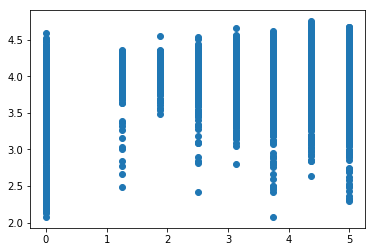

In [8]:
plt.scatter(Y, svr.predict(X))

Now that is a pretty useless visualization. This is because of the discontinous nature of our outcome variable. There's too much data for us to really see what's going on here. If you wanted to look at it you could create histograms, here we'll move on to the scores of both our full fit model and with cross validation. Again if you choose to run it again it will take some time, so you probably shouldn't.

In [9]:
svr.score(X, Y)

0.03856570651298896

In [10]:
from sklearn.model_selection import cross_val_score
cross_val_score(svr, X, Y, cv=5)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", F

array([0.01818511, 0.026411  , 0.03037705, 0.01957949, 0.02451197])

Oh dear, so this did seem not to work very well. In fact it is remarkably poor. Now there are many things that we could do here. 

Firstly the overfit is a problem, even though it was poor in the first place. We could go back and clean up our feature set. There might be some gains to be made by getting rid of the noise.

We could also see how removing the nulls but including dietary information performs. Though its a slight change to the question we could still possibly get some improvements there.

Lastly, we could take our regression problem and turn it into a classifier. With this number of features and a discontinuous outcome, we might have better luck thinking of this as a classification problem. We could make it simpler still by instead of classifying on each possible value, group reviews to some decided high and low values.

__And that is your challenge.__

Transform this regression problem into a binary classifier and clean up the feature set. You can choose whether or not to include nutritional information, but try to cut your feature set down to the 30 most valuable features.

Good luck!

When you've finished that, also take a moment to think about bias. Is there anything in this dataset that makes you think it could be biased, perhaps extremely so?

There is. Several things in fact, but most glaringly is that we don't actually have a random sample. It could be, and probably is, that the people more likely to choose some kinds of recipes are more likely to give high reviews.

After all, people who eat chocolate _might_ just be happier people.

## Attempt 1: Taking the means for each attribute for first 35 highest means.

In [5]:
raw_data['Good_rating'] = np.where(raw_data['rating']<3,0,1)

In [6]:
raw_data.describe()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Good_rating
count,20052.000000,1.593500e+04,15890.000000,1.586900e+04,1.593300e+04,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,...,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000
mean,3.714467,6.322958e+03,100.160793,3.468775e+02,6.225975e+03,0.000299,0.000050,0.000848,0.001346,0.000349,...,0.026332,0.000050,0.000299,0.014861,0.000150,0.000349,0.001396,0.000948,0.022741,0.867544
std,1.340829,3.590460e+05,3840.318527,2.045611e+04,3.333182e+05,0.017296,0.007062,0.029105,0.036671,0.018681,...,0.160123,0.007062,0.017296,0.121001,0.012231,0.018681,0.037343,0.030768,0.149080,0.338994
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,1.980000e+02,3.000000,7.000000e+00,8.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,4.375000,3.310000e+02,8.000000,1.700000e+01,2.940000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,4.375000,5.860000e+02,27.000000,3.300000e+01,7.110000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,5.000000,3.011122e+07,236489.000000,1.722763e+06,2.767511e+07,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
raw_data = raw_data.dropna()

In [8]:
raw_data[raw_data.columns[1:]].mean().sort_values(ascending = False).head(35)

calories             6350.682993
sodium               6252.742310
fat                   346.986826
protein               100.324571
rating                  3.760952
Good_rating             0.879917
bon appétit             0.465393
peanut free             0.423664
soy free                0.409859
gourmet                 0.358232
tree nut free           0.354009
vegetarian              0.348525
kosher                  0.314233
pescatarian             0.307363
quick & easy            0.265444
wheat/gluten-free       0.245903
bake                    0.234808
summer                  0.204866
dessert                 0.186082
winter                  0.162695
side                    0.161498
fall                    0.157590
dairy free              0.156959
no sugar added          0.152421
kidney friendly         0.121218
sugar conscious         0.120777
dinner                  0.119642
onion                   0.116490
milk/cream              0.107980
sauté                   0.106467
tomato    

In [9]:
#Remove rating and good rating for predicators

from sklearn.svm import SVR
svr1 = SVR()
X1 = raw_data[['calories', 'sodium', 'fat', 'protein', 'bon appétit', 'peanut free',
             'soy free','gourmet','tree nut free','vegetarian','kosher','pescatarian',
             'quick & easy','wheat/gluten-free','bake','summer','dessert','winter',
             'side','fall','dairy free','no sugar added','kidney friendly','sugar conscious',
             'dinner','milk/cream','sauté','tomato','vegetable','fruit','vegan','egg']]
Y1 = raw_data.Good_rating
svr1.fit(X1,Y1)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [10]:
svr1.score(X1, Y1)

0.8327906943348533

In [11]:
#Verifying the Score with cross validation
from sklearn.model_selection import cross_val_score
cross_val_score(svr1, X1, Y1, cv=5)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", F

array([0.06726968, 0.06517345, 0.06685473, 0.06963049, 0.08685612])

In [12]:
#Bad scores, let us try using correlation, taking absolute value for 35 highest correlated attributes

np.absolute(raw_data[raw_data.columns[1:]].corr()['Good_rating'][:-1]).sort_values(ascending = False).head(35)

rating            0.881975
drink             0.244511
alcoholic         0.221510
house & garden    0.190687
gin               0.180439
cocktail          0.140805
spirit            0.133547
cocktail party    0.124634
bitters           0.123217
bon appétit       0.122687
harpercollins     0.102869
non-alcoholic     0.093265
sauté             0.087280
rum               0.079279
bake              0.077915
liqueur           0.073836
condiment         0.073449
fall              0.070365
weelicious        0.068728
créme de cacao    0.068193
winter            0.067743
soy free          0.065762
peanut free       0.065177
brandy            0.063690
vegan             0.063344
roast             0.061940
chile pepper      0.061938
tree nut free     0.060173
fortified wine    0.059755
quick & easy      0.059142
chartreuse        0.058039
fruit juice       0.057401
pickles           0.057191
lime juice        0.056785
vermouth          0.056350
Name: Good_rating, dtype: float64

In [14]:
#Exclude rating from the list of predicators
svr2 = SVR()
X2 = raw_data[['bon appétit','sauté','bake','fall','winter','soy free',
               'peanut free','roast','tree nut free','quick & easy',
               'gourmet','onion','tomato','pasta','cheese','no sugar added',
               'thanksgiving','vegetable','beef','pork','spring','mustard',
               'braise','chicken','low carb','herb','marinate','broil',
               'grill/barbecue','sugar conscious','garlic','parmesan']]
Y2 = raw_data.Good_rating
svr2.fit(X2,Y2)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [15]:
svr2.score(X2,Y2)

-0.0026272443053620975

## Attempt 2: Use only continuous data and no binary

In [16]:
#Very bad score so not even trying Cross validation

svr3 = SVR()
X3 = raw_data[['calories', 'sodium', 'fat', 'protein']]
Y3 = raw_data.Good_rating
svr3.fit(X3,Y3)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [17]:
svr3.score(X3,Y3)

0.8710128794130894

In [18]:
cross_val_score(svr3, X3, Y3, cv=5)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", F

array([0.11245013, 0.0795513 , 0.08484393, 0.07430235, 0.10340779])

## Attempt 3 : Use Mixed Component Analysis

In [19]:
#Very Bad scores during cross validation
import prince
X = raw_data.drop(['rating', 'title', 'calories', 'protein', 'fat', 'sodium','Good_rating'], 1)
Y = raw_data.Good_rating
mca = prince.MCA()
mcaX = mca.fit(X).transform(X)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\preprocessing\_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [20]:
svr = SVR()
svr.fit(mcaX,Y)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [21]:
svr.score(mcaX,Y)

#Very Bad Score

-0.0029916760625066097

## Attempt 4: Trying PCA

In [23]:
pca = prince.PCA()
pcaX = pca.fit(X).transform(X)

In [24]:
svr.fit(pcaX,Y)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [25]:
svr.score(pcaX,Y)
#BAd score

0.054242740936617406

## Attempt 5: Trying Eigen values and Eigen vectors

In [30]:
from sklearn.preprocessing import StandardScaler
dX = StandardScaler().fit_transform(X)

# The NumPy covariance function assumes that variables are represented by rows,
# not columns, so we transpose X.
Xt = dX.T
Cx = np.cov(Xt)
print('Covariance Matrix:\n', Cx)
X.describe()

Covariance Matrix:
 [[ 1.00006304e+00 -1.54449367e-04 -5.98443966e-04 ... -7.08222519e-04
  -5.57085864e-04 -2.86582700e-03]
 [-1.54449367e-04  1.00006304e+00 -2.44275219e-04 ... -2.89085062e-04
  -2.27393506e-04 -1.16978457e-03]
 [-5.98443966e-04 -2.44275219e-04  1.00006304e+00 ... -1.12011602e-03
  -8.81080150e-04 -4.53255672e-03]
 ...
 [-7.08222519e-04 -2.89085062e-04 -1.12011602e-03 ...  1.00006304e+00
   7.26055305e-01 -5.36400887e-03]
 [-5.57085864e-04 -2.27393506e-04 -8.81080150e-04 ...  7.26055305e-01
   1.00006304e+00 -4.21931446e-03]
 [-2.86582700e-03 -1.16978457e-03 -4.53255672e-03 ... -5.36400887e-03
  -4.21931446e-03  1.00006304e+00]]


,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,advance prep required,alabama,alaska,alcoholic,almond,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
count,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,...,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000,15864.000000
mean,0.000378,0.000063,0.000946,0.001261,0.000441,0.004602,0.000063,0.000126,0.037191,0.030068,...,0.001261,0.022504,0.000063,0.000315,0.014183,0.000126,0.000315,0.001324,0.000819,0.021243
std,0.019445,0.007940,0.030736,0.035485,0.021002,0.067681,0.007940,0.011228,0.189236,0.170780,...,0.035485,0.148320,0.007940,0.017751,0.118249,0.011228,0.017751,0.036360,0.028615,0.144198
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [32]:
###### Calculating eigenvalues and eigenvectors.
eig_val_cov, eig_vec_cov = np.linalg.eig(Cx)

# Inspecting the eigenvalues and eigenvectors.
for i in range(len(eig_val_cov)):
    eigvec_cov = eig_vec_cov[:, i].reshape(1, 674).T
    print('Eigenvector {}: \n{}'.format(i + 1, eigvec_cov))
    print('Eigenvalue {}: {}'.format(i + 1, eig_val_cov[i]))
    print(40 * '-')

print(
    'The percentage of total variance in the dataset explained by each',
    'component calculated by hand.\n',
    (eig_val_cov / sum(eig_val_cov))*100
)

Eigenvector 1: 
[[-9.19082965e-03]
 [-4.19352302e-03]
 [ 1.93714700e-04]
 [ 1.57129103e-03]
 [-1.30704082e-03]
 [-1.34900311e-02]
 [ 1.66196804e-03]
 [ 3.89452097e-03]
 [ 1.19942157e-01]
 [-2.66256180e-02]
 [-5.24279742e-03]
 [-6.62935365e-03]
 [ 1.38216941e-03]
 [-7.34953553e-03]
 [ 4.13063480e-03]
 [ 1.19708854e-02]
 [-6.01599706e-02]
 [-1.18816449e-02]
 [-5.54515686e-04]
 [-1.79031968e-02]
 [ 1.01718402e-03]
 [-1.40556169e-03]
 [-5.62298449e-03]
 [-4.93587322e-03]
 [-7.24677823e-03]
 [ 1.82900972e-04]
 [-3.39326648e-03]
 [ 3.78944512e-03]
 [-2.11251021e-03]
 [-1.46478996e-02]
 [ 2.44993543e-03]
 [ 1.35181142e-02]
 [-6.79204846e-02]
 [-1.92185176e-02]
 [-3.69217103e-03]
 [ 1.44536570e-02]
 [ 1.36185605e-02]
 [ 7.69009287e-04]
 [ 5.81370022e-03]
 [ 4.78363543e-02]
 [ 7.37341633e-03]
 [ 4.54060573e-03]
 [ 1.34256716e-02]
 [ 9.53346697e-03]
 [-1.73561901e-02]
 [ 1.18924333e-02]
 [-3.99824850e-02]
 [ 3.28943130e-03]
 [-2.41322141e-02]
 [-1.66489994e-03]
 [ 5.47514625e-02]
 [-2.19063561e-

Eigenvector 16: 
[[-1.44219332e-02]
 [ 1.25213169e-02]
 [ 7.87446459e-03]
 [ 1.07932439e-02]
 [ 3.29634753e-02]
 [ 6.35458768e-03]
 [-9.00664382e-03]
 [-1.78347510e-02]
 [-1.13582383e-02]
 [ 1.42640758e-02]
 [-1.25301831e-03]
 [ 1.27506002e-02]
 [ 4.00977449e-02]
 [-2.99579944e-02]
 [ 4.13101281e-03]
 [-1.82107242e-02]
 [ 1.05898599e-02]
 [ 4.05292050e-02]
 [ 1.08184327e-02]
 [-3.44056004e-02]
 [ 2.79996015e-03]
 [-1.33194977e-02]
 [ 4.25252633e-02]
 [ 1.18739398e-02]
 [-1.27137911e-02]
 [-1.05885441e-03]
 [-2.56904095e-02]
 [ 1.11203349e-04]
 [ 2.13216817e-02]
 [ 4.66009581e-02]
 [ 6.25012281e-02]
 [ 4.83098172e-02]
 [-3.37445482e-02]
 [ 2.16255652e-02]
 [ 4.32585170e-03]
 [-2.81711410e-02]
 [-1.25066565e-02]
 [-9.22592371e-04]
 [-7.90268478e-03]
 [-2.27738641e-02]
 [ 8.08227535e-03]
 [ 3.90584037e-03]
 [-2.46995432e-02]
 [ 7.57137387e-03]
 [ 6.27020051e-02]
 [-5.88478691e-02]
 [-8.13969038e-02]
 [-1.40841124e-02]
 [ 1.58712904e-02]
 [-5.79123722e-04]
 [-3.55129191e-02]
 [-3.50651715e

Eigenvector 29: 
[[-3.37315252e-03]
 [-3.40453621e-03]
 [-7.44488746e-03]
 [-1.28412450e-03]
 [ 5.69369301e-03]
 [-1.50158498e-03]
 [ 1.02769242e-03]
 [ 2.15126009e-04]
 [ 1.71649867e-02]
 [ 9.88744154e-02]
 [ 6.20329735e-03]
 [-1.78252820e-03]
 [ 8.27745882e-03]
 [ 6.12109268e-03]
 [-1.86886755e-03]
 [-1.99398619e-03]
 [ 9.94339340e-03]
 [-9.18888047e-03]
 [-2.21943162e-03]
 [ 4.16143103e-03]
 [ 3.03962386e-03]
 [ 5.64289375e-04]
 [-8.10973093e-04]
 [ 1.34670156e-03]
 [ 7.71798373e-03]
 [ 1.71552867e-03]
 [-5.76658339e-03]
 [-2.81317392e-04]
 [-6.79146920e-04]
 [ 1.80380298e-03]
 [-4.27954132e-03]
 [ 3.08234762e-02]
 [ 1.30167931e-02]
 [-3.78960173e-03]
 [ 7.22142028e-03]
 [-2.14457496e-04]
 [ 4.07028939e-03]
 [-2.15379998e-03]
 [ 5.22985246e-03]
 [ 8.71112385e-03]
 [ 2.81195097e-03]
 [-9.57733100e-04]
 [ 6.22600749e-03]
 [ 3.76526332e-03]
 [ 6.43772711e-03]
 [ 1.08027088e-03]
 [-1.05311169e-03]
 [ 4.82295686e-04]
 [ 3.04744052e-03]
 [ 1.84646571e-03]
 [-6.23311490e-04]
 [ 4.85204183e

Eigenvector 44: 
[[-6.78880122e-02]
 [ 7.59650707e-03]
 [-1.01930169e-02]
 [-1.10878434e-02]
 [-8.82232700e-02]
 [ 2.27851352e-02]
 [ 1.86750080e-02]
 [-1.43913505e-03]
 [ 9.99668520e-03]
 [ 4.65246171e-03]
 [ 7.49126444e-03]
 [-1.73086558e-02]
 [ 1.02020213e-03]
 [-1.84570163e-02]
 [-8.07331515e-03]
 [ 1.32679485e-03]
 [ 2.91871655e-02]
 [-2.81499207e-02]
 [ 2.57253416e-02]
 [ 1.72571897e-03]
 [-1.95516682e-02]
 [-2.91480016e-03]
 [-7.71916202e-03]
 [ 9.29331723e-04]
 [-3.77653809e-02]
 [-7.99569048e-03]
 [-1.77818290e-02]
 [ 1.94245201e-03]
 [ 7.12349045e-04]
 [-1.97233338e-03]
 [ 7.57649217e-03]
 [-4.07842727e-02]
 [-1.15407778e-02]
 [ 1.10638715e-02]
 [-1.28497500e-02]
 [ 4.99176051e-02]
 [ 3.14326976e-02]
 [ 1.11585465e-02]
 [-6.79292531e-02]
 [ 4.77898453e-02]
 [ 3.05665172e-02]
 [-7.29511482e-03]
 [ 1.61903389e-02]
 [-3.50493729e-03]
 [ 2.77029739e-02]
 [-2.89533030e-02]
 [-7.62080542e-02]
 [-5.10674824e-03]
 [-9.37238407e-02]
 [-1.50276348e-03]
 [ 2.49489157e-03]
 [-5.60728172e

Eigenvector 55: 
[[-8.39003455e-03]
 [-5.28218883e-03]
 [ 6.77879342e-02]
 [-4.83100251e-03]
 [ 1.68008800e-01]
 [-1.09201782e-02]
 [ 5.06140326e-03]
 [-3.00380069e-03]
 [ 1.26384393e-03]
 [ 1.50621423e-02]
 [ 1.48494847e-02]
 [-2.96144883e-02]
 [-4.09705170e-02]
 [-1.75417670e-02]
 [ 9.94631939e-03]
 [ 1.97694751e-02]
 [-2.69577953e-02]
 [ 3.11595519e-03]
 [-2.22408318e-02]
 [ 2.66387422e-02]
 [ 2.75125862e-03]
 [-8.51585685e-02]
 [ 9.19074373e-03]
 [-1.40235174e-02]
 [-6.33250975e-02]
 [ 2.50107498e-03]
 [ 5.05411573e-03]
 [-4.40820531e-03]
 [-1.42440234e-03]
 [ 3.22470362e-03]
 [ 3.31398610e-02]
 [ 5.02601238e-03]
 [ 9.74882531e-03]
 [-3.04051765e-02]
 [-7.32259767e-02]
 [ 1.40370732e-02]
 [ 7.90025314e-04]
 [ 1.69353082e-02]
 [ 1.70501112e-02]
 [ 1.98103122e-02]
 [ 6.60318384e-03]
 [ 3.64562584e-03]
 [ 1.32263592e-02]
 [-1.27221808e-02]
 [-2.36628774e-02]
 [ 3.70329947e-02]
 [-2.73786938e-02]
 [ 2.20053036e-02]
 [-2.63861831e-02]
 [ 1.08362985e-03]
 [-2.96541332e-02]
 [-5.42970499e

Eigenvector 73: 
[[-3.49495718e-02]
 [ 3.19150354e-03]
 [ 2.53761306e-02]
 [-4.47650488e-02]
 [ 1.20356709e-01]
 [-1.61829601e-02]
 [-2.29198354e-03]
 [ 1.33707487e-02]
 [-1.21011265e-02]
 [-1.81750374e-02]
 [-3.74090065e-02]
 [-5.27020823e-03]
 [ 2.20123625e-02]
 [ 2.46678617e-03]
 [ 4.23177427e-02]
 [-3.36080508e-02]
 [ 4.41424718e-02]
 [ 1.19622840e-02]
 [ 1.65593947e-02]
 [ 5.73524793e-03]
 [-1.46854061e-03]
 [ 9.21840995e-03]
 [ 1.96409686e-02]
 [ 5.75899970e-03]
 [-1.06394670e-02]
 [-1.81103275e-02]
 [-6.46975352e-02]
 [-6.53063073e-03]
 [-5.33371286e-03]
 [-1.48452036e-02]
 [ 4.92034862e-02]
 [-1.05102891e-02]
 [-1.97530179e-02]
 [ 2.62248947e-02]
 [-5.38798269e-03]
 [ 1.59540033e-02]
 [-2.82039465e-03]
 [ 1.15258086e-02]
 [-3.81887032e-02]
 [-5.78882699e-02]
 [ 5.24436608e-03]
 [-1.00244945e-02]
 [-2.66006351e-02]
 [-1.19089643e-02]
 [ 1.68181791e-02]
 [ 1.02269608e-02]
 [-5.44205504e-02]
 [-1.18004853e-02]
 [ 5.34102852e-02]
 [-2.09046244e-02]
 [ 4.40123089e-02]
 [-3.94065617e

Eigenvector 86: 
[[ 4.92333199e-03]
 [-2.73771291e-03]
 [-1.08472369e-02]
 [-8.93424906e-03]
 [ 4.59672116e-02]
 [-6.83454316e-03]
 [-4.08296590e-06]
 [ 2.25616981e-03]
 [ 1.62201620e-03]
 [-8.65171561e-04]
 [ 6.61802766e-03]
 [ 5.73382797e-03]
 [ 1.36431707e-03]
 [ 2.62000173e-03]
 [-8.96934479e-05]
 [ 4.43937932e-04]
 [ 7.13351997e-02]
 [ 4.01572897e-02]
 [-3.69425201e-03]
 [ 2.47010508e-02]
 [ 1.35131726e-03]
 [ 3.47077393e-03]
 [ 1.02689363e-02]
 [ 2.89304181e-03]
 [ 3.38604131e-03]
 [ 8.73768078e-04]
 [ 2.13077112e-02]
 [ 4.38980603e-04]
 [ 7.76096874e-03]
 [-2.66642036e-03]
 [ 2.52448513e-02]
 [-6.62043773e-03]
 [ 1.62135844e-02]
 [ 2.02948526e-02]
 [-1.50888145e-02]
 [ 3.58796262e-02]
 [-1.83739580e-03]
 [-1.93319353e-03]
 [-8.85360813e-03]
 [-1.63348903e-03]
 [ 1.32430630e-03]
 [ 3.70411460e-03]
 [ 1.02230960e-02]
 [-3.04095441e-03]
 [ 4.94547302e-03]
 [ 4.08991176e-03]
 [ 2.92170891e-02]
 [-5.50553714e-03]
 [ 8.56469611e-03]
 [-1.15039705e-03]
 [ 2.81102110e-03]
 [ 1.79548249e

Eigenvector 103: 
[[ 1.67698712e-03]
 [ 5.79509330e-04]
 [-9.44464138e-03]
 [ 8.33258633e-03]
 [ 1.46529103e-01]
 [ 2.29676238e-03]
 [-1.37029726e-02]
 [-2.50362721e-04]
 [ 4.95659099e-05]
 [-1.79239613e-02]
 [ 1.07468357e-02]
 [ 2.20757126e-03]
 [ 2.08853666e-03]
 [-4.35356515e-04]
 [ 1.95892993e-02]
 [-1.08495920e-02]
 [ 1.29503917e-02]
 [ 4.72963732e-02]
 [ 1.12749294e-02]
 [ 3.40351091e-03]
 [-2.21743601e-03]
 [ 4.58343978e-03]
 [ 2.38602991e-02]
 [ 8.99665044e-03]
 [ 1.01095790e-02]
 [ 1.97095714e-02]
 [ 9.81946168e-03]
 [-1.49224545e-03]
 [ 1.11349099e-02]
 [-2.73645061e-02]
 [-8.70554530e-02]
 [ 9.12773658e-03]
 [ 1.79766986e-02]
 [ 1.50809955e-02]
 [ 1.10977949e-02]
 [ 8.62573312e-03]
 [-1.77376281e-02]
 [ 9.33183012e-03]
 [ 7.52629399e-03]
 [-6.70673890e-02]
 [-6.79260146e-03]
 [ 2.29527322e-02]
 [-1.15317252e-03]
 [ 1.44046412e-02]
 [ 6.46371078e-03]
 [ 7.62702604e-03]
 [-1.55586153e-02]
 [-6.80045307e-03]
 [-1.96475712e-03]
 [-1.41107486e-03]
 [ 4.10964054e-02]
 [-5.55677052

Eigenvector 119: 
[[-4.05071015e-02]
 [-9.46231263e-04]
 [ 3.10793770e-03]
 [-3.96546264e-02]
 [ 2.71869139e-02]
 [-2.45469687e-02]
 [-3.92471932e-02]
 [ 6.17961240e-03]
 [-7.45781373e-03]
 [-3.53810783e-02]
 [-4.17914773e-02]
 [-4.05222423e-03]
 [-7.05241935e-02]
 [-2.63153256e-02]
 [ 2.32856601e-02]
 [-2.92860506e-02]
 [-7.81048770e-03]
 [ 8.55724477e-03]
 [-2.94677945e-02]
 [-2.26403918e-02]
 [-2.04914224e-02]
 [ 3.80563368e-03]
 [ 4.83519362e-02]
 [-3.16259540e-02]
 [-1.87526066e-02]
 [-6.44142562e-03]
 [ 1.81945575e-02]
 [-2.25965429e-04]
 [-9.10272201e-03]
 [ 5.28201028e-03]
 [ 2.60818769e-02]
 [-5.04475432e-03]
 [-3.77779686e-02]
 [-1.05364197e-02]
 [-1.10309026e-02]
 [ 4.40539981e-02]
 [-1.62023492e-02]
 [ 1.26595743e-02]
 [-5.47566373e-02]
 [-2.93425607e-02]
 [ 2.55838220e-02]
 [-5.69979040e-02]
 [-2.89113621e-02]
 [ 1.57394915e-02]
 [-7.15593529e-03]
 [ 1.45987743e-02]
 [ 7.12943285e-02]
 [ 2.06765325e-03]
 [ 1.00084505e-02]
 [-2.63891331e-02]
 [ 2.76421504e-02]
 [ 4.80336615

Eigenvector 136: 
[[ 0.01435814]
 [ 0.00035941]
 [ 0.01281398]
 [-0.00222199]
 [ 0.0352159 ]
 [-0.00868927]
 [ 0.02580896]
 [ 0.03839521]
 [ 0.01813111]
 [ 0.02473329]
 [-0.0064643 ]
 [ 0.01872535]
 [ 0.01506127]
 [ 0.00701418]
 [ 0.00266444]
 [ 0.02543125]
 [-0.04618145]
 [ 0.04056315]
 [ 0.01112501]
 [-0.06117398]
 [ 0.03163388]
 [ 0.03662258]
 [-0.03424375]
 [ 0.01205061]
 [ 0.00718776]
 [ 0.057181  ]
 [-0.00858038]
 [ 0.01820522]
 [-0.02081699]
 [-0.00842042]
 [-0.01851888]
 [ 0.00785925]
 [ 0.05607332]
 [-0.02702668]
 [-0.04274442]
 [-0.02512033]
 [ 0.00051887]
 [-0.0135309 ]
 [-0.05494104]
 [ 0.00399472]
 [-0.00470915]
 [ 0.02625014]
 [-0.01708593]
 [-0.02968659]
 [-0.07002011]
 [ 0.06040132]
 [-0.05244136]
 [-0.0439509 ]
 [-0.04103385]
 [ 0.02757475]
 [ 0.02570545]
 [-0.02567931]
 [ 0.03519887]
 [ 0.01895478]
 [-0.01514157]
 [-0.07020956]
 [ 0.0211727 ]
 [ 0.02632416]
 [ 0.11968106]
 [-0.03636257]
 [-0.0844387 ]
 [-0.01319797]
 [-0.04411943]
 [ 0.01220098]
 [ 0.00417403]
 [ 0.03

 [-6.71360559e-03]]
Eigenvalue 151: 0.43349512320738803
----------------------------------------
Eigenvector 152: 
[[ 4.07104498e-03]
 [-8.32226262e-03]
 [-4.36375824e-03]
 [ 1.40025960e-02]
 [ 6.91006579e-02]
 [-2.43221710e-03]
 [ 2.60680090e-03]
 [ 4.03673947e-03]
 [-4.93476431e-02]
 [-9.40420711e-02]
 [ 9.74078537e-03]
 [ 2.19622477e-03]
 [ 6.79859254e-04]
 [-1.18181650e-02]
 [ 1.70683562e-02]
 [ 6.55392734e-04]
 [-1.92823921e-02]
 [-2.85707116e-02]
 [-7.31279069e-03]
 [ 7.83852098e-03]
 [ 1.00473180e-03]
 [-2.31102153e-02]
 [ 1.65808064e-02]
 [ 4.84894330e-03]
 [-4.64797554e-03]
 [ 1.71899848e-02]
 [-6.07738425e-02]
 [-6.57995360e-03]
 [-6.00434146e-03]
 [-9.58033868e-03]
 [-4.37412552e-02]
 [ 1.75221945e-02]
 [ 3.32230603e-02]
 [-2.68537390e-02]
 [ 1.23769951e-02]
 [ 1.66903105e-02]
 [ 2.57374130e-03]
 [ 3.85140034e-03]
 [-3.72162416e-02]
 [-4.34156660e-02]
 [-4.47998027e-03]
 [-2.24118554e-02]
 [ 6.07176871e-03]
 [-2.15178545e-02]
 [-1.08897321e-02]
 [ 5.80068830e-03]
 [-7.786605

Eigenvector 168: 
[[ 5.75923309e-02]
 [ 7.85792780e-03]
 [-2.49040134e-02]
 [-3.66367132e-02]
 [ 2.82494201e-02]
 [-1.39151810e-03]
 [-2.37496821e-02]
 [ 1.19831422e-02]
 [ 3.58941207e-03]
 [-2.75650643e-02]
 [ 1.47711547e-02]
 [-6.67796505e-03]
 [ 1.10617307e-02]
 [ 6.19034143e-04]
 [ 2.01222556e-02]
 [ 3.52537215e-02]
 [ 3.37730771e-02]
 [-2.79838007e-02]
 [ 2.74686212e-02]
 [-5.43088041e-02]
 [ 1.70279278e-02]
 [ 3.81157749e-03]
 [-1.90109336e-02]
 [-1.03659075e-02]
 [ 7.01083501e-02]
 [ 1.58628194e-02]
 [ 2.94976569e-02]
 [-9.80754275e-03]
 [-6.30861511e-03]
 [ 5.88342678e-03]
 [ 1.14665159e-02]
 [ 3.70673785e-02]
 [-2.48385055e-02]
 [-1.73373691e-02]
 [-9.34448989e-03]
 [-1.75376778e-02]
 [-5.34822057e-02]
 [-1.75998038e-03]
 [-6.29656573e-03]
 [-6.72626158e-02]
 [ 2.70836083e-02]
 [-1.31354521e-03]
 [ 1.97216434e-02]
 [-5.56841181e-03]
 [-3.40874323e-02]
 [-1.74691935e-02]
 [-1.04151209e-02]
 [ 6.22248143e-03]
 [-2.29220958e-02]
 [ 1.07130658e-02]
 [-5.83726916e-03]
 [ 1.79378966

Eigenvector 186: 
[[-7.38444676e-02]
 [ 7.82266308e-03]
 [ 8.92763438e-03]
 [ 2.73946052e-02]
 [-1.27712713e-02]
 [ 1.51241031e-02]
 [ 4.69062025e-02]
 [-3.79577061e-03]
 [-1.27204677e-02]
 [-2.89404845e-02]
 [-2.27111932e-02]
 [ 5.30418053e-02]
 [ 5.04313938e-02]
 [-9.61143013e-02]
 [-8.53406512e-03]
 [ 9.30494783e-02]
 [-1.81111843e-02]
 [-1.48450770e-02]
 [ 1.60273885e-02]
 [-2.77635365e-02]
 [-9.40372195e-03]
 [ 5.43698662e-02]
 [ 4.69304868e-02]
 [-1.48928825e-02]
 [ 6.08614007e-02]
 [-1.48345398e-01]
 [ 4.38047557e-03]
 [-5.79463621e-03]
 [-1.81997737e-02]
 [-1.62503573e-02]
 [-5.78614504e-03]
 [-3.88768877e-02]
 [-3.25211063e-02]
 [ 1.22416303e-02]
 [-4.46462873e-03]
 [-3.13541242e-02]
 [-3.07438714e-02]
 [-1.74906620e-02]
 [-3.82165307e-02]
 [ 6.90818729e-02]
 [ 8.43305711e-03]
 [ 1.67370100e-02]
 [ 2.07774963e-02]
 [ 1.20712126e-02]
 [ 2.74029376e-02]
 [ 4.47415725e-02]
 [ 5.23293138e-03]
 [-3.46993632e-02]
 [-1.36904751e-02]
 [-1.44136139e-02]
 [-1.24310800e-03]
 [ 7.72762157

Eigenvector 205: 
[[ 2.28460578e-02]
 [-7.86893192e-03]
 [-5.90243625e-03]
 [-1.67841068e-02]
 [-1.82722653e-02]
 [-1.84378641e-02]
 [ 1.59948966e-02]
 [-1.27410372e-02]
 [-5.28872689e-03]
 [ 3.00721790e-02]
 [ 1.02437024e-01]
 [-1.94478276e-02]
 [-1.59848747e-02]
 [ 5.39897258e-02]
 [-7.49347002e-03]
 [-2.48270839e-02]
 [ 9.00726635e-03]
 [-5.86554294e-02]
 [ 1.11882129e-02]
 [-4.29200154e-02]
 [-1.92965617e-02]
 [-1.96311113e-02]
 [-2.70241017e-02]
 [ 2.42022239e-02]
 [-9.68418102e-03]
 [ 1.39595559e-01]
 [ 8.72193067e-03]
 [ 9.69538123e-03]
 [ 1.83104115e-02]
 [-4.02780302e-02]
 [ 1.49273356e-02]
 [-1.12771511e-01]
 [-1.79471544e-02]
 [ 1.79196221e-02]
 [ 5.33077986e-02]
 [ 2.23126906e-02]
 [-4.30495244e-02]
 [-2.63480392e-02]
 [ 2.58518512e-02]
 [ 1.45998267e-02]
 [-8.16567390e-02]
 [ 1.34409869e-01]
 [ 7.51553345e-03]
 [ 8.93282463e-02]
 [ 5.59983063e-02]
 [-5.94658080e-02]
 [ 4.50794121e-03]
 [-3.85721983e-02]
 [ 1.23095675e-02]
 [ 5.61154496e-02]
 [ 7.46201998e-03]
 [ 2.85592918

 [ 2.45906876e-02]]
Eigenvalue 220: 0.5417569840697116
----------------------------------------
Eigenvector 221: 
[[-2.20305973e-02]
 [-1.94004828e-02]
 [-7.95718752e-03]
 [ 1.95302207e-02]
 [ 2.08273713e-02]
 [ 2.08638919e-02]
 [ 1.95986710e-02]
 [-3.69108781e-02]
 [-1.02183058e-03]
 [ 3.54544715e-02]
 [-1.90306861e-02]
 [-1.73954622e-02]
 [-1.14141242e-02]
 [ 1.78909745e-02]
 [ 3.58256439e-02]
 [-1.35062334e-02]
 [-7.65183295e-02]
 [-3.45944038e-02]
 [ 3.85422367e-03]
 [-2.77757857e-02]
 [-1.22854476e-03]
 [-4.25666679e-03]
 [ 2.68485968e-02]
 [-1.29459057e-02]
 [ 1.47352019e-02]
 [ 4.77127268e-03]
 [ 2.97871991e-02]
 [ 9.78900318e-04]
 [ 4.83905030e-04]
 [-1.31541339e-02]
 [-2.19447643e-03]
 [-1.54306483e-02]
 [ 4.47133170e-03]
 [ 1.29921405e-02]
 [-2.50682850e-02]
 [ 3.73300566e-02]
 [-3.88534857e-02]
 [-1.25506594e-02]
 [ 4.26288069e-02]
 [ 2.83280926e-02]
 [ 1.08293507e-02]
 [ 3.58735784e-02]
 [-2.93023506e-02]
 [ 5.18240201e-03]
 [-1.97166528e-02]
 [-4.05607029e-02]
 [ 9.0648171

Eigenvector 239: 
[[ 8.14886003e-02]
 [-1.61558619e-03]
 [-8.89674434e-02]
 [ 2.89134004e-02]
 [ 1.22143974e-02]
 [ 5.26445240e-02]
 [ 1.51784775e-02]
 [-1.34182781e-02]
 [ 7.13640952e-03]
 [ 3.86236810e-02]
 [ 6.79364377e-02]
 [-5.81140658e-03]
 [ 6.24810131e-03]
 [-6.99720312e-02]
 [-2.65877046e-02]
 [ 1.08039568e-01]
 [ 7.10544746e-03]
 [ 4.44888227e-02]
 [-7.76792246e-02]
 [ 2.10044411e-03]
 [-2.20281655e-04]
 [-6.31418875e-02]
 [-9.66388458e-04]
 [ 2.66101751e-02]
 [-1.14136280e-02]
 [ 2.97654119e-02]
 [ 6.59601305e-03]
 [ 2.12739961e-02]
 [-1.26691551e-02]
 [-2.65843293e-02]
 [-2.91188759e-02]
 [ 4.20150327e-02]
 [-2.70819061e-03]
 [ 2.95027052e-02]
 [-7.15502073e-03]
 [-4.30123941e-02]
 [ 7.22589147e-02]
 [ 1.73214619e-02]
 [ 2.18793220e-03]
 [ 3.04682863e-02]
 [-1.04742986e-01]
 [-5.29187197e-02]
 [ 4.23335958e-02]
 [-1.04540430e-01]
 [-1.27677851e-02]
 [-4.87999586e-03]
 [-4.28355615e-02]
 [-3.37527112e-02]
 [ 1.46026284e-02]
 [ 3.58282317e-03]
 [-4.60340786e-03]
 [-5.87515954

Eigenvector 251: 
[[-2.43107464e-02]
 [-8.69301600e-03]
 [-2.00936444e-02]
 [ 3.22754571e-02]
 [-1.85055693e-02]
 [-7.81007295e-02]
 [-5.69743531e-02]
 [-2.46567318e-02]
 [-7.42226584e-03]
 [-8.32935965e-03]
 [-9.14076939e-03]
 [-1.97633389e-03]
 [ 1.84679405e-02]
 [-8.73593314e-03]
 [-2.12331618e-02]
 [-1.22417409e-02]
 [-2.51838110e-03]
 [-9.92706351e-03]
 [-2.16234449e-03]
 [ 4.38024770e-02]
 [ 6.82382955e-03]
 [ 9.60533472e-03]
 [ 2.63994685e-02]
 [-7.26060350e-02]
 [-5.32821776e-02]
 [-3.32456819e-02]
 [ 2.24504197e-02]
 [ 9.74615446e-03]
 [-4.76771132e-02]
 [-7.10584503e-03]
 [-1.82055125e-02]
 [-6.10445147e-02]
 [ 9.51821786e-03]
 [-4.43316101e-02]
 [ 1.42625009e-03]
 [-1.51240491e-02]
 [-4.50611141e-02]
 [-1.73734212e-03]
 [-2.41342441e-02]
 [ 3.47736917e-02]
 [ 1.37184116e-02]
 [-4.67822708e-02]
 [-3.58890160e-02]
 [ 2.12989313e-02]
 [-5.45290890e-03]
 [-5.68776099e-02]
 [ 1.64895907e-03]
 [-1.38538456e-02]
 [-1.46139481e-02]
 [ 2.37125848e-03]
 [-3.79614135e-02]
 [ 3.28509699

 [ 1.23055404e-02]]
Eigenvalue 267: 0.5837252170444871
----------------------------------------
Eigenvector 268: 
[[ 1.59960996e-02]
 [-1.18667113e-02]
 [ 1.95189769e-02]
 [ 1.03288373e-01]
 [ 8.83986235e-04]
 [-1.51873301e-03]
 [ 3.10126734e-02]
 [-7.45535266e-04]
 [ 3.65722711e-03]
 [-1.36336013e-02]
 [-3.64489232e-02]
 [ 2.19232572e-02]
 [ 2.75301119e-02]
 [ 4.34473247e-02]
 [ 2.90233966e-02]
 [-7.50913514e-05]
 [ 3.91707312e-03]
 [-4.06052136e-02]
 [-1.56492533e-01]
 [ 3.60624792e-03]
 [-2.69926190e-02]
 [-1.91377584e-02]
 [-1.54074620e-03]
 [ 7.43331771e-02]
 [-4.38218227e-02]
 [ 2.84973199e-02]
 [-1.27280576e-02]
 [ 4.16572775e-02]
 [ 2.53466077e-02]
 [ 1.12591401e-02]
 [ 9.00245735e-03]
 [-9.86850692e-03]
 [-3.74681982e-04]
 [ 1.13772144e-01]
 [ 6.28339858e-03]
 [-2.17708552e-02]
 [-1.15781479e-01]
 [-1.32977914e-02]
 [-2.60211331e-02]
 [-2.25736901e-02]
 [ 3.16978994e-02]
 [ 5.95222837e-02]
 [-6.56200847e-02]
 [-6.06422619e-04]
 [-6.26347420e-02]
 [ 4.04434497e-02]
 [-3.7517880

Eigenvector 283: 
[[ 0.0214952 ]
 [ 0.01782987]
 [ 0.02469875]
 [ 0.0019922 ]
 [ 0.00302246]
 [-0.05071567]
 [ 0.01620205]
 [-0.05793008]
 [ 0.00901936]
 [-0.02234133]
 [ 0.037602  ]
 [-0.00608156]
 [-0.02267663]
 [-0.00192885]
 [-0.02056589]
 [ 0.00183039]
 [-0.03779352]
 [ 0.02819309]
 [-0.06465903]
 [ 0.04963042]
 [ 0.01449158]
 [-0.02035716]
 [ 0.05980506]
 [ 0.08765441]
 [ 0.00421544]
 [ 0.01560238]
 [-0.02747601]
 [ 0.03120165]
 [ 0.00038182]
 [ 0.08374661]
 [ 0.02052363]
 [-0.03977603]
 [-0.02070919]
 [-0.07346512]
 [ 0.11338496]
 [ 0.03641669]
 [ 0.05496844]
 [-0.01806648]
 [-0.05621411]
 [ 0.02948118]
 [ 0.00750503]
 [ 0.00532034]
 [-0.06928656]
 [ 0.04134491]
 [-0.02178561]
 [-0.05829936]
 [-0.01674802]
 [ 0.02315542]
 [ 0.0052014 ]
 [ 0.02440745]
 [ 0.00779167]
 [ 0.00529293]
 [ 0.05635061]
 [-0.01871313]
 [ 0.02220364]
 [-0.00676504]
 [ 0.00536096]
 [ 0.02306098]
 [-0.00135433]
 [-0.04518437]
 [ 0.02571596]
 [-0.01620014]
 [-0.06587218]
 [-0.01193805]
 [-0.02955959]
 [-0.02

Eigenvector 303: 
[[ 4.33438215e-02]
 [-1.17347544e-02]
 [-3.55254420e-02]
 [ 8.97094109e-05]
 [ 8.32158810e-05]
 [-7.08737866e-05]
 [-2.17721278e-02]
 [ 6.43399020e-02]
 [-9.23402376e-04]
 [ 1.89279790e-03]
 [-2.99664871e-02]
 [-1.78573178e-02]
 [-2.72502633e-02]
 [-2.99276062e-03]
 [-2.49268782e-02]
 [-3.91176950e-02]
 [-1.53424921e-02]
 [-5.38251972e-02]
 [ 6.04951566e-02]
 [ 1.17818035e-01]
 [ 1.81024624e-02]
 [ 2.20177811e-02]
 [-1.30866804e-02]
 [-9.03941183e-03]
 [ 6.27421255e-02]
 [ 2.49623767e-02]
 [-1.41193494e-02]
 [ 8.77126050e-03]
 [ 2.35618674e-02]
 [ 1.33943735e-02]
 [ 3.30532453e-02]
 [-4.23420845e-02]
 [-2.23624737e-02]
 [-5.09652078e-02]
 [-1.09208547e-01]
 [-4.20335747e-02]
 [-5.71614706e-02]
 [-9.32540468e-02]
 [ 3.45821966e-02]
 [ 7.44799778e-03]
 [-2.08586733e-02]
 [-2.40806141e-02]
 [-4.95227031e-02]
 [-4.83718325e-02]
 [-4.61768112e-02]
 [ 5.02501002e-02]
 [-1.45694692e-04]
 [ 5.72651149e-02]
 [-1.78348242e-02]
 [ 8.64895313e-02]
 [ 1.57049447e-02]
 [ 5.60470512

Eigenvector 322: 
[[-6.42343613e-02]
 [-1.76207056e-02]
 [-3.08740510e-02]
 [-5.56074916e-02]
 [ 9.66690465e-03]
 [-2.71422391e-02]
 [ 4.41547738e-03]
 [-7.23045487e-02]
 [-3.41889832e-04]
 [-4.92935886e-03]
 [-9.16200830e-02]
 [ 1.04829432e-02]
 [-4.64090411e-02]
 [ 4.82146906e-03]
 [-5.94270436e-03]
 [ 3.89725496e-02]
 [-3.67980858e-03]
 [-1.35551459e-02]
 [-1.05251150e-01]
 [ 1.66582542e-02]
 [ 5.35764972e-03]
 [-2.80650891e-03]
 [ 5.97366011e-02]
 [-1.68882246e-02]
 [ 2.49428259e-02]
 [ 1.75995864e-02]
 [ 2.75300606e-02]
 [-1.15985053e-01]
 [ 4.96956975e-02]
 [-5.97491934e-02]
 [-2.07891280e-02]
 [-3.54123542e-02]
 [ 5.00865100e-03]
 [-1.73837535e-02]
 [-2.92544979e-02]
 [-7.84784036e-02]
 [ 1.03936959e-01]
 [-5.87248566e-02]
 [ 4.69161260e-02]
 [-7.54188694e-03]
 [-1.72023679e-02]
 [ 3.27415480e-02]
 [-2.02391995e-02]
 [-5.30624570e-03]
 [ 6.20315784e-02]
 [ 1.44139125e-02]
 [-4.62101429e-02]
 [-3.22355658e-02]
 [ 1.68065946e-02]
 [ 5.27931458e-02]
 [ 1.61105181e-03]
 [-5.58892967

Eigenvector 342: 
[[ 4.02819305e-02]
 [ 1.34087079e-03]
 [ 5.27846601e-03]
 [ 1.72550775e-02]
 [ 9.56496847e-03]
 [-4.35603880e-02]
 [ 7.16706518e-02]
 [ 7.27620134e-03]
 [-3.67658392e-02]
 [ 3.84191757e-02]
 [ 2.97596749e-02]
 [-3.82545995e-03]
 [ 1.54726247e-02]
 [ 3.01947963e-03]
 [ 2.31964408e-03]
 [ 1.69605868e-02]
 [ 2.16308885e-02]
 [-8.62544762e-02]
 [-6.31197743e-02]
 [-3.18805913e-02]
 [-1.15056607e-02]
 [-4.80750909e-02]
 [ 1.96394916e-02]
 [ 1.98040848e-02]
 [-4.74209193e-04]
 [ 5.22801765e-02]
 [ 1.11837467e-02]
 [-1.78074628e-02]
 [-5.92753965e-02]
 [ 4.25974347e-02]
 [ 2.15873586e-02]
 [ 2.87347460e-02]
 [ 2.60157587e-02]
 [-1.44319123e-02]
 [ 7.50901623e-03]
 [ 5.07006485e-02]
 [ 1.66543296e-03]
 [ 1.82384315e-02]
 [ 2.72624322e-02]
 [-2.85661986e-02]
 [-4.54599837e-02]
 [ 5.04270231e-02]
 [ 1.59102395e-02]
 [-2.45050902e-02]
 [-1.18923144e-02]
 [-6.55093174e-02]
 [-1.26612902e-02]
 [ 8.55755816e-03]
 [ 9.38283094e-04]
 [ 1.64428995e-02]
 [ 2.18134269e-02]
 [ 5.72796790

Eigenvector 362: 
[[ 3.23167151e-02]
 [-4.88899601e-03]
 [-1.59615542e-02]
 [ 3.23098694e-02]
 [-2.43156883e-02]
 [ 6.18082497e-02]
 [ 6.21584147e-02]
 [-6.52547696e-04]
 [ 7.95182562e-03]
 [ 1.42623503e-02]
 [-1.74298416e-03]
 [-1.95525411e-03]
 [-3.68586678e-02]
 [ 2.78287731e-02]
 [-1.65663690e-02]
 [-1.32726198e-02]
 [-6.54562969e-03]
 [ 1.69012437e-02]
 [-1.12050295e-02]
 [ 5.61475347e-02]
 [-1.85930526e-02]
 [ 2.33013753e-02]
 [ 2.12761956e-03]
 [ 3.26896699e-02]
 [ 2.20378586e-02]
 [ 2.99691901e-02]
 [-2.77773754e-03]
 [-9.00497979e-03]
 [ 6.17499238e-02]
 [-6.96758846e-03]
 [ 4.59115783e-03]
 [-1.81995361e-02]
 [-8.59263110e-02]
 [-2.05287864e-02]
 [-7.96497145e-03]
 [ 5.25379347e-03]
 [-8.59872806e-03]
 [ 2.79574064e-02]
 [ 9.75381383e-03]
 [ 4.06203989e-02]
 [-2.59650089e-02]
 [ 3.88851810e-02]
 [ 2.05757005e-02]
 [ 9.84756039e-04]
 [ 1.67757479e-02]
 [-3.17116760e-02]
 [ 7.80348638e-02]
 [-1.15233272e-02]
 [ 1.48818203e-02]
 [-3.25252551e-02]
 [-6.03441434e-03]
 [-7.57908311

Eigenvector 379: 
[[-1.44056954e-02]
 [ 1.87232273e-02]
 [-3.11648547e-03]
 [-3.53646221e-02]
 [-1.60210398e-02]
 [-4.45039913e-02]
 [-2.33434661e-02]
 [ 3.32270295e-03]
 [-1.25835716e-03]
 [-7.65518240e-03]
 [-1.28449582e-02]
 [-2.03806119e-02]
 [-3.63120369e-02]
 [ 1.86662455e-03]
 [-1.03674831e-02]
 [-6.24732604e-02]
 [ 1.34847027e-02]
 [ 2.81338968e-02]
 [ 2.66894906e-02]
 [ 2.45162599e-02]
 [ 2.66712079e-02]
 [ 3.45884105e-02]
 [-8.87512528e-03]
 [ 1.83610555e-02]
 [-1.49898465e-02]
 [-2.70107482e-02]
 [ 2.82001876e-03]
 [-3.97514650e-02]
 [ 1.32570561e-02]
 [-1.77841427e-02]
 [-3.00247715e-02]
 [ 4.24746702e-02]
 [-1.79988738e-02]
 [ 6.34211059e-02]
 [ 1.17009647e-02]
 [ 4.24566738e-02]
 [ 4.50527848e-02]
 [-8.58107469e-03]
 [ 3.24304799e-02]
 [ 5.29025026e-04]
 [-1.62163794e-03]
 [-4.10480432e-02]
 [-6.09784014e-02]
 [ 3.86547680e-02]
 [-2.89456085e-02]
 [ 5.93140153e-02]
 [ 5.50340545e-02]
 [-3.05807109e-03]
 [-6.68418724e-02]
 [-4.65146152e-02]
 [ 2.35524171e-02]
 [-1.93908765

 [ 3.96603222e-03]]
Eigenvalue 401: 1.052006833172171
----------------------------------------
Eigenvector 402: 
[[ 1.22221850e-02]
 [-4.39909286e-02]
 [ 3.60905026e-03]
 [ 9.05251843e-03]
 [-2.56596615e-03]
 [-2.08125433e-02]
 [-3.99104980e-02]
 [ 9.31682805e-02]
 [ 6.26515839e-03]
 [-4.54515125e-02]
 [ 8.97210294e-03]
 [ 4.36457472e-02]
 [-1.82584704e-02]
 [-4.82895403e-02]
 [ 2.46741042e-03]
 [ 4.61438004e-03]
 [-2.25124536e-02]
 [ 5.09140482e-02]
 [ 9.75354547e-02]
 [-8.39612824e-03]
 [-1.25174597e-01]
 [ 4.09301503e-02]
 [-1.21506634e-01]
 [ 2.27017234e-02]
 [-6.76700416e-05]
 [-1.27248000e-02]
 [ 2.07974492e-03]
 [-1.27977969e-01]
 [ 1.83255889e-02]
 [-4.17739739e-02]
 [-7.66668853e-04]
 [-8.88065839e-03]
 [ 1.85994956e-02]
 [ 4.55326427e-03]
 [-3.30888810e-02]
 [ 5.73615559e-02]
 [-4.43759154e-02]
 [ 6.20825110e-02]
 [-2.55628756e-02]
 [ 2.46371508e-02]
 [ 5.40492765e-02]
 [ 5.44883195e-02]
 [-6.53180471e-02]
 [ 2.34399338e-02]
 [-1.06085944e-02]
 [ 3.77144390e-02]
 [-1.84358721

Eigenvector 423: 
[[ 6.09608539e-02]
 [-5.83715523e-03]
 [ 1.38500832e-01]
 [-2.54550822e-02]
 [-4.14406883e-03]
 [ 2.26065734e-02]
 [-8.99903560e-02]
 [-2.85092357e-02]
 [-1.51843191e-02]
 [ 2.60543057e-02]
 [-5.80293973e-02]
 [-1.06807806e-02]
 [ 6.57853714e-02]
 [ 1.43880986e-03]
 [-1.32764579e-02]
 [-6.70059920e-02]
 [ 6.00157699e-03]
 [-1.08266454e-02]
 [-3.71081056e-03]
 [ 5.08549985e-02]
 [-2.10381991e-02]
 [-6.17721914e-02]
 [ 2.19471180e-02]
 [ 1.64867492e-02]
 [ 7.37393567e-02]
 [-2.15678638e-02]
 [-4.13157256e-03]
 [ 2.52020306e-02]
 [-8.08909941e-02]
 [-7.93398602e-02]
 [ 3.88163261e-04]
 [ 1.56971176e-02]
 [-1.30682096e-02]
 [-8.96111916e-03]
 [ 1.89242810e-03]
 [-2.59818538e-02]
 [ 3.81041907e-02]
 [ 1.33713469e-02]
 [-1.57675474e-02]
 [ 2.48881379e-02]
 [-3.88306230e-02]
 [-5.66201530e-03]
 [-5.16008495e-02]
 [ 3.67267058e-02]
 [-7.90085401e-02]
 [ 2.95006039e-02]
 [-3.61061448e-02]
 [-2.95459835e-02]
 [ 4.06678677e-03]
 [ 3.34210274e-02]
 [-5.56722940e-02]
 [-2.03719339

Eigenvector 440: 
[[-4.48435925e-02]
 [-1.84764744e-02]
 [-2.56908074e-03]
 [-3.08324655e-03]
 [ 2.33912973e-02]
 [-3.46580758e-02]
 [ 8.56150105e-02]
 [ 8.54437481e-02]
 [ 4.14885303e-03]
 [ 3.26130681e-02]
 [-2.88324664e-02]
 [ 3.06434123e-02]
 [ 2.40680261e-02]
 [ 4.39583942e-02]
 [-5.54681934e-03]
 [ 3.34808044e-02]
 [ 3.89321634e-02]
 [ 1.89073344e-02]
 [-1.33653153e-02]
 [ 2.95065839e-02]
 [ 3.30406587e-02]
 [ 6.12432859e-02]
 [-1.34678436e-02]
 [ 7.30317548e-02]
 [ 7.46624285e-03]
 [ 3.34658776e-02]
 [-3.76146009e-03]
 [-1.36957911e-01]
 [ 1.23109478e-02]
 [-7.65162427e-02]
 [ 1.23391186e-02]
 [ 2.85579710e-02]
 [ 6.87124275e-03]
 [-4.63013588e-02]
 [-1.68678775e-02]
 [-1.49010765e-02]
 [ 2.48441674e-02]
 [ 4.13211054e-02]
 [-8.14495115e-04]
 [ 2.85672995e-02]
 [-6.18457708e-04]
 [-4.31821955e-02]
 [ 1.12692032e-02]
 [ 2.80735368e-02]
 [-3.38483349e-02]
 [ 1.57359288e-02]
 [-9.67620822e-03]
 [ 8.10103362e-02]
 [ 1.08630122e-02]
 [ 7.32955344e-02]
 [ 1.48120565e-02]
 [ 2.02497458

Eigenvector 455: 
[[ 0.07924684]
 [-0.02508568]
 [-0.03521196]
 [ 0.08128502]
 [-0.00781442]
 [ 0.11334071]
 [ 0.01690028]
 [ 0.02010344]
 [-0.0142285 ]
 [ 0.03008759]
 [ 0.0209362 ]
 [ 0.01560014]
 [-0.01209321]
 [ 0.02351273]
 [-0.03681626]
 [ 0.03961698]
 [ 0.00706313]
 [-0.01927274]
 [ 0.06456133]
 [ 0.01817579]
 [-0.00278021]
 [-0.07035979]
 [ 0.01382546]
 [ 0.0288989 ]
 [-0.08361016]
 [ 0.02440606]
 [ 0.0151168 ]
 [-0.01882895]
 [-0.05646181]
 [-0.04190719]
 [-0.01755369]
 [ 0.012894  ]
 [-0.0290947 ]
 [ 0.13381832]
 [ 0.13404263]
 [ 0.08866939]
 [-0.03148539]
 [-0.02316241]
 [ 0.00129657]
 [ 0.01916133]
 [ 0.01040592]
 [ 0.03574627]
 [ 0.0849463 ]
 [-0.00158996]
 [ 0.02556471]
 [-0.00026805]
 [ 0.03227588]
 [ 0.05464546]
 [-0.04778588]
 [ 0.03996802]
 [ 0.00801405]
 [ 0.05607462]
 [-0.05575652]
 [-0.00236302]
 [-0.05225573]
 [-0.06249707]
 [ 0.00442028]
 [-0.01476992]
 [-0.00558761]
 [-0.00336507]
 [-0.04225567]
 [ 0.02361427]
 [ 0.05234442]
 [-0.0124539 ]
 [ 0.03122261]
 [-0.01

Eigenvector 472: 
[[-4.28137352e-02]
 [-1.34163611e-01]
 [-1.01617259e-02]
 [ 1.30884817e-02]
 [ 1.06067972e-02]
 [-1.53009750e-02]
 [ 3.97471353e-02]
 [-1.10199804e-01]
 [-4.90100568e-03]
 [ 3.92264231e-02]
 [ 1.24968448e-02]
 [-1.25648052e-02]
 [-3.95114845e-03]
 [ 2.30252285e-02]
 [-3.41881838e-04]
 [ 1.54375705e-03]
 [ 1.33865068e-02]
 [ 6.77573186e-02]
 [ 1.60285696e-02]
 [-2.21737823e-02]
 [-4.17516491e-02]
 [ 3.25252785e-02]
 [ 8.96064999e-02]
 [-2.57657181e-02]
 [ 2.43961392e-02]
 [-3.46285475e-02]
 [ 2.15961847e-04]
 [-1.18165224e-01]
 [ 1.85422924e-02]
 [ 2.96705327e-02]
 [ 6.86721843e-03]
 [-1.45846451e-02]
 [-1.78997475e-02]
 [-4.68761492e-03]
 [-3.11157672e-02]
 [ 3.35223950e-02]
 [-1.12974699e-02]
 [-3.89154445e-02]
 [ 1.38295164e-02]
 [ 1.61220830e-02]
 [ 4.50445887e-02]
 [-2.50278189e-02]
 [-6.07849940e-03]
 [ 3.48931562e-02]
 [ 4.26362930e-03]
 [-2.80397500e-02]
 [-7.86064309e-03]
 [-9.79950661e-02]
 [ 5.99820786e-02]
 [ 1.55232756e-01]
 [ 2.17936110e-02]
 [ 5.54689448

 [ 3.12744208e-02]]
Eigenvalue 484: 1.0076079224766712
----------------------------------------
Eigenvector 485: 
[[-0.00162071]
 [ 0.00936916]
 [-0.00248928]
 [-0.007657  ]
 [-0.02597819]
 [ 0.06406695]
 [-0.06033327]
 [-0.04486545]
 [ 0.01386989]
 [-0.02599638]
 [ 0.05775375]
 [ 0.05911699]
 [ 0.01841114]
 [ 0.04185401]
 [-0.0011227 ]
 [-0.01416203]
 [-0.01834701]
 [-0.01448463]
 [-0.00650086]
 [ 0.05022733]
 [-0.09195451]
 [-0.01101045]
 [ 0.07212314]
 [-0.06391368]
 [-0.01042827]
 [-0.04137217]
 [ 0.01170605]
 [ 0.06350343]
 [ 0.0319969 ]
 [-0.0377048 ]
 [ 0.00719774]
 [-0.01721099]
 [-0.00494892]
 [ 0.00247224]
 [ 0.03911642]
 [-0.00132547]
 [-0.00755401]
 [ 0.0470032 ]
 [-0.00176071]
 [-0.00481435]
 [-0.06693448]
 [ 0.01085243]
 [ 0.01161218]
 [-0.05492395]
 [ 0.03625413]
 [ 0.03604685]
 [ 0.05084709]
 [-0.10462639]
 [-0.03786056]
 [ 0.0165688 ]
 [-0.01215081]
 [-0.03218635]
 [ 0.0174518 ]
 [ 0.01165978]
 [-0.01011234]
 [-0.12097355]
 [ 0.03745398]
 [-0.01392121]
 [-0.0088546 ]
 

Eigenvector 501: 
[[ 2.20593541e-02]
 [-1.83741183e-02]
 [ 1.04296069e-02]
 [-4.56273674e-03]
 [ 4.76117647e-03]
 [ 4.73563157e-04]
 [ 5.78971538e-02]
 [-2.11743569e-02]
 [ 7.48099248e-03]
 [-1.26964106e-02]
 [-1.86059881e-02]
 [-6.17669588e-02]
 [-6.03977254e-02]
 [ 2.26090826e-03]
 [-1.11317196e-02]
 [-2.44111412e-02]
 [ 2.43867369e-02]
 [-3.14254897e-03]
 [-2.20270863e-02]
 [-3.37729765e-02]
 [ 6.57465640e-02]
 [-3.03114706e-02]
 [ 1.07564327e-02]
 [ 2.39975006e-02]
 [ 4.25799124e-03]
 [ 3.19134612e-02]
 [ 4.05433287e-03]
 [ 1.02700954e-01]
 [-2.35375416e-02]
 [ 3.47887056e-02]
 [ 1.88949312e-03]
 [-3.00797208e-02]
 [ 2.22234390e-02]
 [-3.59351686e-02]
 [ 5.81227286e-03]
 [ 2.70357581e-02]
 [ 2.03429359e-02]
 [-1.99094618e-02]
 [-2.44639927e-02]
 [-2.24957305e-02]
 [ 2.38288617e-02]
 [ 3.55529373e-03]
 [ 4.71847528e-02]
 [-2.86611538e-02]
 [ 1.48227805e-02]
 [-1.61213879e-02]
 [ 5.48784702e-03]
 [-9.99553739e-02]
 [-4.87762341e-03]
 [-4.33545941e-02]
 [ 2.89219148e-03]
 [ 3.94106114

Eigenvector 524: 
[[ 4.98879523e-02]
 [-8.09659907e-03]
 [-2.02746725e-02]
 [ 5.59165833e-02]
 [-1.33549483e-02]
 [-9.27543387e-03]
 [ 5.89257666e-04]
 [ 2.93236909e-02]
 [ 5.74345032e-03]
 [ 2.89445149e-02]
 [ 2.58377282e-02]
 [ 3.37539219e-02]
 [ 9.23523752e-02]
 [-3.76270536e-02]
 [ 1.26198432e-02]
 [-2.92313935e-02]
 [-4.87653649e-02]
 [ 2.65016870e-02]
 [ 2.44357502e-02]
 [ 1.27442126e-02]
 [ 4.85425535e-02]
 [-5.37685207e-02]
 [ 6.28354415e-02]
 [-1.94698856e-02]
 [ 1.08937686e-02]
 [ 3.40068284e-02]
 [ 1.97787038e-02]
 [-2.37607580e-02]
 [ 7.73029277e-02]
 [-4.45910744e-02]
 [-2.85302226e-02]
 [-4.52969837e-02]
 [ 1.28460154e-02]
 [-1.91016374e-02]
 [ 4.65187763e-03]
 [-3.19338330e-02]
 [ 4.61797175e-02]
 [-1.19349985e-01]
 [ 3.67502040e-02]
 [ 1.78753325e-02]
 [ 4.78461573e-02]
 [-2.95901857e-02]
 [-9.49082973e-02]
 [-2.47490443e-03]
 [-6.47506679e-02]
 [-2.83163188e-02]
 [-2.30826563e-02]
 [-2.75329714e-02]
 [-2.20765837e-02]
 [-4.73893905e-02]
 [-3.56844578e-02]
 [ 3.82693179

Eigenvector 551: 
[[-1.72455819e-02]
 [-2.30211983e-02]
 [ 5.70177936e-03]
 [-5.15702700e-03]
 [ 3.54463767e-02]
 [-6.96092506e-02]
 [ 2.74055611e-02]
 [-2.27097604e-02]
 [ 1.75373199e-02]
 [ 3.67465129e-02]
 [ 1.86006148e-02]
 [-7.25313744e-02]
 [-3.56810774e-02]
 [ 2.48824212e-02]
 [ 1.49234391e-02]
 [ 2.62469638e-02]
 [ 3.48855256e-02]
 [ 3.22119789e-02]
 [ 5.73588042e-02]
 [ 2.80480360e-02]
 [ 3.80070792e-02]
 [ 3.76882190e-02]
 [-5.40188441e-03]
 [-4.45335238e-02]
 [ 4.09331785e-02]
 [ 7.00263393e-02]
 [ 2.56215718e-02]
 [ 2.21700751e-02]
 [-2.40699616e-03]
 [ 6.00658245e-02]
 [ 1.52252212e-02]
 [-8.90230778e-03]
 [-1.33596173e-02]
 [ 4.98211887e-02]
 [ 2.84617645e-02]
 [-3.05095358e-03]
 [-1.62581079e-02]
 [ 4.18127161e-02]
 [-7.91870673e-02]
 [ 6.27465990e-03]
 [-4.60283731e-02]
 [-3.20983128e-02]
 [ 1.02076969e-01]
 [ 1.62060015e-02]
 [ 2.42860503e-02]
 [ 2.81085955e-02]
 [-4.22481029e-03]
 [ 4.87724214e-02]
 [ 4.59372819e-02]
 [ 2.88842690e-03]
 [ 1.93847145e-02]
 [ 2.14310615

Eigenvector 575: 
[[-5.81533758e-02]
 [ 3.23041325e-04]
 [ 7.67766032e-03]
 [-2.10110653e-02]
 [ 2.94185633e-02]
 [ 1.12960959e-01]
 [ 2.73331064e-02]
 [-1.89093101e-03]
 [ 6.16975222e-03]
 [-2.79911468e-02]
 [ 7.30273567e-02]
 [-4.19809666e-02]
 [-4.00491879e-02]
 [ 4.33549124e-02]
 [-2.84104305e-02]
 [ 1.62025590e-01]
 [-2.32836901e-02]
 [-6.85591711e-02]
 [-4.82907149e-02]
 [ 5.49601235e-04]
 [ 3.06023420e-02]
 [-2.19094517e-02]
 [ 6.10305931e-03]
 [ 8.46909143e-02]
 [ 5.69269275e-02]
 [ 5.30882999e-02]
 [-6.22005478e-03]
 [ 9.75191115e-03]
 [-5.59757272e-02]
 [-4.67995238e-02]
 [-2.29040458e-02]
 [ 2.45126436e-02]
 [ 9.77733325e-03]
 [ 4.24572487e-02]
 [ 4.08525807e-02]
 [-1.81967625e-03]
 [ 5.95777811e-02]
 [-9.44004531e-03]
 [ 7.97246141e-02]
 [-5.24419368e-03]
 [-3.88916932e-02]
 [-8.14366421e-02]
 [-8.38611419e-02]
 [ 4.19022329e-02]
 [ 7.00455858e-02]
 [-4.04401899e-02]
 [-1.37770324e-02]
 [-2.22529327e-02]
 [-3.88005311e-02]
 [ 1.55983678e-02]
 [-3.20426538e-02]
 [ 7.01291835

 [-4.14553952e-02]]
Eigenvalue 599: 0.8760476835398391
----------------------------------------
Eigenvector 600: 
[[-3.06386896e-02]
 [ 6.37687304e-03]
 [ 1.75033285e-02]
 [ 5.39188343e-02]
 [ 1.46662042e-02]
 [-3.60099353e-02]
 [-3.04136981e-02]
 [-3.03285561e-02]
 [-4.80780502e-03]
 [ 3.76313506e-03]
 [-6.20610658e-02]
 [ 3.15966223e-02]
 [ 6.44872932e-03]
 [-5.27884994e-02]
 [-9.85136055e-03]
 [ 3.48875574e-02]
 [-4.46266006e-02]
 [-7.39122556e-03]
 [ 1.83079796e-02]
 [ 7.85215029e-02]
 [ 2.32447251e-02]
 [ 5.31544068e-03]
 [ 2.54062660e-02]
 [-1.04292694e-01]
 [ 1.35079908e-02]
 [-9.18014203e-03]
 [-2.71385489e-03]
 [-3.38256082e-02]
 [-1.25161012e-01]
 [ 1.23942225e-02]
 [ 2.92322213e-02]
 [ 1.69550336e-03]
 [ 5.33847333e-03]
 [ 5.33766887e-02]
 [-1.94402698e-02]
 [ 9.45018556e-02]
 [ 7.78127670e-02]
 [ 1.38334548e-02]
 [-5.82559057e-02]
 [ 8.49345910e-03]
 [ 8.84272268e-03]
 [-3.08850148e-02]
 [ 6.68518783e-02]
 [-1.77873473e-03]
 [-6.60449209e-02]
 [ 6.24236509e-02]
 [ 3.7806997

Eigenvector 624: 
[[ 2.92048562e-02]
 [-2.35234229e-02]
 [ 3.66598698e-02]
 [-5.49931749e-02]
 [ 2.05722612e-02]
 [ 2.77467650e-03]
 [ 6.68738651e-02]
 [-6.58630478e-02]
 [-1.86931358e-03]
 [-4.13831015e-02]
 [ 3.18361738e-02]
 [-3.70304949e-02]
 [-9.44234439e-02]
 [-6.20259444e-03]
 [-2.30240039e-02]
 [-1.65327760e-02]
 [-2.25867283e-02]
 [ 1.02389582e-02]
 [ 4.70260801e-02]
 [-3.09499881e-02]
 [ 4.70816454e-02]
 [-4.10927319e-02]
 [-3.66962676e-02]
 [-1.30607956e-01]
 [ 5.45738292e-02]
 [-3.00081690e-02]
 [-2.57515868e-03]
 [-3.00283710e-02]
 [-2.82787534e-02]
 [-8.85370413e-02]
 [ 2.38790629e-02]
 [-6.74624285e-04]
 [ 2.07927537e-02]
 [ 3.10173322e-02]
 [ 1.22408656e-02]
 [-4.04969963e-02]
 [ 4.85473072e-02]
 [ 7.63123378e-02]
 [-1.18035586e-01]
 [ 1.08428709e-02]
 [-1.81393575e-02]
 [-5.62553242e-02]
 [ 6.11610721e-02]
 [ 5.17358186e-04]
 [ 3.07405996e-02]
 [ 6.13525683e-02]
 [-2.50924279e-02]
 [-9.68350824e-04]
 [-7.80840901e-02]
 [ 1.73194775e-02]
 [ 7.27040888e-03]
 [ 2.26912304

Eigenvector 648: 
[[-7.36145853e-03]
 [-2.19360600e-02]
 [-6.46008463e-03]
 [-2.78774446e-02]
 [-1.87901933e-02]
 [-6.27270159e-02]
 [-5.40948100e-03]
 [ 1.05877451e-02]
 [-4.89992427e-03]
 [-1.97554128e-05]
 [ 8.24937266e-02]
 [ 3.68716348e-02]
 [-1.44048308e-02]
 [-7.10093545e-03]
 [ 2.79409744e-02]
 [-2.24650026e-02]
 [ 9.40928420e-03]
 [-2.13765278e-02]
 [-5.00406919e-02]
 [-3.64935696e-02]
 [ 2.46369582e-02]
 [ 2.97504533e-02]
 [-1.87688965e-03]
 [-1.45786278e-02]
 [ 7.44108271e-02]
 [ 7.05055165e-03]
 [ 2.34934766e-02]
 [-5.67484408e-02]
 [-2.69069909e-02]
 [ 8.83060875e-02]
 [-1.93716308e-03]
 [-4.42379010e-03]
 [-6.03273952e-03]
 [ 7.81747448e-02]
 [ 9.51234732e-03]
 [-1.73740511e-02]
 [-2.74662756e-02]
 [ 3.72163835e-02]
 [-2.14339992e-02]
 [-6.08188512e-03]
 [-1.60583838e-02]
 [-7.95295326e-03]
 [-8.72711952e-02]
 [-5.24274863e-02]
 [-5.44514178e-02]
 [ 2.95537135e-02]
 [-2.52038479e-02]
 [-3.39004359e-02]
 [ 1.07123794e-02]
 [-8.51212012e-03]
 [-3.37504929e-02]
 [ 6.47162355

 [ 1.11746641e+00  9.20292351e-01  7.44385553e-01  5.50441400e-01
  4.84486347e-01  4.58633381e-01  4.10862318e-01  3.91612192e-01
  3.76870804e-01  3.75259612e-01  3.69498707e-01  3.56485983e-01
  3.52032694e-01  3.45522395e-01  3.38084100e-01  3.29847793e-01
  3.24814603e-01  3.17223838e-01  3.14158851e-01  3.11793620e-01
  3.08077820e-01  3.06225133e-01  3.04529528e-01  3.03272030e-01
  3.02248205e-01  5.10598533e-03  6.31546682e-03  1.28326864e-02
  1.81880647e-02  2.92699526e-01  2.91730913e-01  2.43029187e-02
  2.62505831e-02  2.71303136e-02  2.68654140e-02  2.96291545e-02
  3.17878919e-02  3.54711807e-02  3.62373431e-02  3.83092256e-02
 -7.31566151e-17  5.27466931e-18  2.85610821e-01  2.84336634e-01
  2.84808844e-01  2.83653427e-01  2.80731591e-01  2.76505770e-01
  2.74214824e-01  2.72874790e-01  2.69560790e-01  2.68953264e-01
  2.66802820e-01  2.65686487e-01  2.64409752e-01  2.63811316e-01
  2.62193040e-01  2.59220221e-01  2.58214965e-01  2.57481252e-01
  2.55430151e-01  2.5419

In [37]:
# Create P, which we will use to transform Cx into Cy to get Y, the
# dimensionally-reduced representation of X.
P = eig_vec_cov[:, 0]

# Transform X into Y.
XX = P.T.dot(Xt).reshape(-1,1)

In [38]:
svr.fit(XX,Y)

c:\users\bharath\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [39]:
svr.score(XX,Y)
#Again Very bad score

0.0338701329919997

## Conclusion:

I have tried using 5 methods which includes:

1. Selecting top 30+ featurs having highest means.
2. Selecting top 30+ features haing highest co-relations.
3. MCA.
4. PCA.
5. Eigen Values and Eigen Vectors.

None gave me proper scores. The ones where I got highest scores was not real. So I think the data here is not good,
This is speciall